In [3]:
# palette from scanpy, will be used later
zeileis_28 = [
    "#023fa5", "#7d87b9", "#bec1d4", "#d6bcc0", "#bb7784", "#8e063b", "#4a6fe3", "#8595e1", 
    "#b5bbe3", "#e6afb9", "#e07b91", "#d33f6a", "#11c638", "#8dd593", "#c6dec7", "#ead3c6", 
    "#f0b98d", "#ef9708", "#0fcfc0", "#9cded6", "#d5eae7", "#f3e1eb", "#f6c4e1", "#f79cd4", 
    '#7f7f7f', "#c7c7c7", "#1CE6FF", "#336600"]# from http://godsnotwheregodsnot.blogspot.de/2012/09/color-distribution-methodology.html
godsnot_102 = [
    # "#000000",  # remove the black, as often, we have black colored annotation
    "#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059", "#FFDBE5", 
    "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87", "#5A0007", 
    "#809693", "#6A3A4C", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80", "#61615A", 
    "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100", "#DDEFFF", 
    "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F", "#372101", 
    "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09", "#00489C", 
    "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66", "#885578", 
    "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C", "#34362D", 
    "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81", "#575329", 
    "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00", "#7900D7", 
    "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700", "#549E79", 
    "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329", "#5B4534", 
    "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72"]
%load_ext autoreload
%autoreload 2

## Now let's focused on inhibitory neuron cells only with 100k resolution

In [1]:
from fasthigashi.FastHigashi_Wrapper import *
config = "/home/rzhang/fast_higashi_git/config_dir/config_m3c_Tian_HumanBrain_Inh_100k.JSON"
# initialize the model
wrapper = FastHigashi(config_path=config,
                      path2input_cache=None, # when setting at None, will use the temp_dir on the JSON file
                      path2result_dir=None, # same as above
                      off_diag=100,
                      filter=True,
                      do_conv=False, # 
                      do_rwr=True, # 
                      do_col=False,
                      no_col=False)


# From contact pairs to the sparse matrices and store them on disk
if not os.path.exists(os.path.join(wrapper.temp_dir, "raw", "%s_sparse_adj.npy" % wrapper.chrom_list[0])):
    start = time.time()
    wrapper.fast_process_data()
    print("contact pairs to sparse mtx takes: %.2f s" % (time.time() - start))


# packing data from sparse matrices to sparse tensors
start = time.time()
wrapper.prep_dataset(batch_norm=True) # when there's a batch_id given in the JSON, it will try to pre-correct batch related coverage bias / off-diag ratio bias
print("packing sparse mtx takes: %.2f s" % (time.time() - start))

wrapper.run_model(extra="rwr",
                  rank=256,
                  n_iter_parafac=1,
                  tol=2e-5)

wrapper.load_model(extra="rwr",
                   rank=256,
                   n_iter_parafac=1
                   )
embed = wrapper.fetch_cell_embedding(final_dim=256,
                                     restore_order=False)

wrapper.correct_batch_linear("Donor")
wrapper.correct_batch_linear(["Donor", "Region"])
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
# Check available label information
print (wrapper.label_info.columns)
from umap import UMAP
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import math
embedding = embed['embed_l2_norm_correct_Donor_Region']
L1 = wrapper.label_info["CellClass"]
L2 = wrapper.label_info["MajorType"]
L3 = wrapper.label_info["SubType"]
Region = wrapper.label_info["Region"]
Donor = wrapper.label_info["Donor"]

# downsampling
kept = [np.where(L1 !='Non-neuronal Cells')[0]]
non_neuron = np.unique(L2[L1 == 'Non-neuronal Cells'])
for u_ in non_neuron:
    a = np.where(L2 == u_)[0]
    if len(a) > 1000:
        a = np.random.choice(a, 1000, replace=False)
        kept.append(a)
kept = np.concatenate(kept)
vec = UMAP(n_components=2, n_neighbors=25, random_state=0, min_dist=0.3).fit(embedding).transform(embedding)

setting to gpu:7
total number of cells that pass qc check 30034 bad 5 total: 30039
cache file = /home/rzhang/Higashi/Temp/m3c_tian_100k/inh/cache_intra_100000_offdiag_100_.pkl
loading cached input from /home/rzhang/Higashi/Temp/m3c_tian_100k/inh/cache_intra_100000_offdiag_100_.pkl
gpu mem
c_nvmlMemory_t(total: 25757220864 B, free: 25430523904 B, used: 326696960 B)


breaking into batches:   0%|          | 0/22 [00:00<?, ?it/s]

sparsity 0.00525330556190407
do_conv False do_rwr True do_col False
recommend_bs_cell [10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012, 10012] pinning memory
packing sparse mtx takes: 222.29 s
dim1_0.6_rank_256_niterp_1_rwr
n_iter_parafac 1
empty params initialized
time elapsed: 0.04


initializing params:   0%|          | 0/22 [00:00<?, ?it/s]

rwr iters: [8 8 7 7 8 7 7 8 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
time elapsed: 200.74
finish init
Starting iteration 0

PARAFAC2 re=1.480 takes 368.1s
Starting iteration 1

PARAFAC2 re=0.751 7.43e-01 variation min2.2e-01 at chrom 20, max8.5e-01 at chrom 0 takes 369.9s
Starting iteration 2

PARAFAC2 re=0.748 8.11e-03 variation min5.0e-03 at chrom 3, max1.1e-02 at chrom 15 takes 372.8s
Starting iteration 3

PARAFAC2 re=0.746 5.95e-03 variation min4.2e-03 at chrom 18, max8.5e-03 at chrom 15 takes 372.6s
Starting iteration 4

PARAFAC2 re=0.745 1.69e-03 variation min1.7e-03 at chrom 18, max4.2e-03 at chrom 21 takes 372.3s
Starting iteration 5

PARAFAC2 re=0.745 6.22e-04 variation min4.9e-04 at chrom 18, max1.7e-03 at chrom 21 takes 372.2s
Starting iteration 6

PARAFAC2 re=0.745 3.22e-04 variation min1.9e-04 at chrom 18, max7.5e-04 at chrom 21 takes 372.0s
Starting iteration 7

PARAFAC2 re=0.745 2.02e-04 variation min9.8e-05 at chrom 18, max4.7e-04 at chrom 21 takes 372.2s
Starting iteration 8

PARA

2022-12-08 17:50:05.057932: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


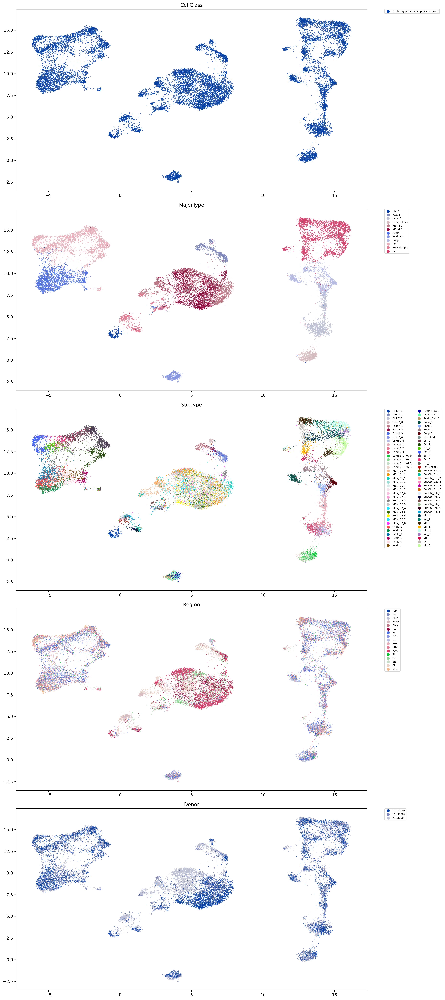

/tmp/ipykernel_2105749/1178114426.py:26: UserWarning: The palette list has more values (130) than needed (74), which may not be intended.
  ax = sns.scatterplot(x=vec[:, 0], y=vec[:, 1], hue=wrapper.label_info[col], s=3, alpha=0.8, linewidth=0, palette=superbig)


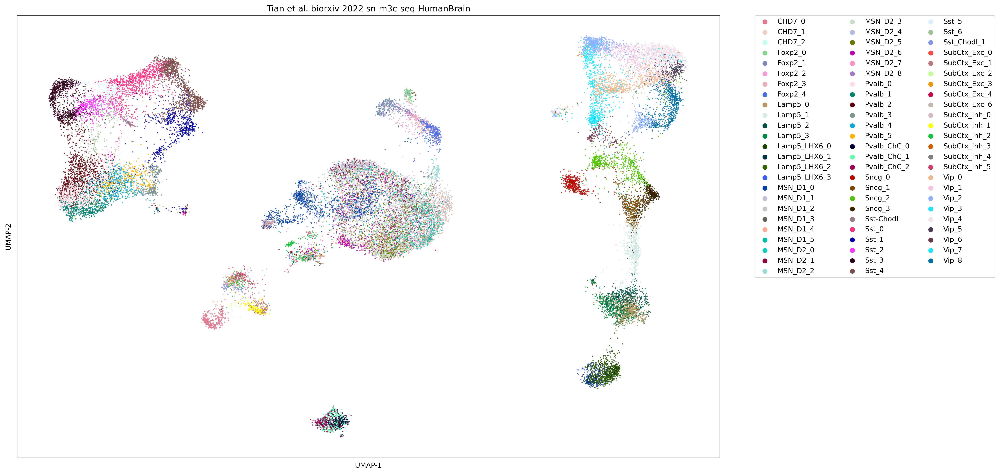

In [4]:
# Visualization directly
fig = plt.figure(figsize=(15, 40))
for col_index, col in enumerate(["CellClass", "MajorType", "SubType", "Region", "Donor"]):
    ax = plt.subplot(6, 1, col_index + 1)
    if len(np.unique(wrapper.label_info[col])) <= 28:
        pal = {k:v for k,v in zip(np.unique(wrapper.label_info[col]), zeileis_28)}
    elif len(np.unique(wrapper.label_info[col])) <= 102+28:
        superbig = zeileis_28 + godsnot_102
        pal = {k:v for k,v in zip(np.unique(wrapper.label_info[col]), superbig)}   
    else:
        superbig = zeileis_28 + godsnot_102 + zeileis_28 + godsnot_102
        pal = {k:v for k,v in zip(np.unique(wrapper.label_info[col]), superbig)}   
    sns.scatterplot(x=vec[:, 0], y=vec[:, 1], hue=wrapper.label_info[col], ax=ax, s=2, alpha=0.8, linewidth=0,
                   palette=pal)
    handles, labels = ax.get_legend_handles_labels()
    labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.05, 1), loc=2, 
              borderaxespad=0., ncol=int(math.ceil(len(labels)) / 40 + 1), prop={'size': 6})
    ax.set_title(col)
plt.tight_layout()
plt.show()
plt.close('all')

fig = plt.figure(figsize=(20, 9.5))
col = 'SubType'
ax = sns.scatterplot(x=vec[:, 0], y=vec[:, 1], hue=wrapper.label_info[col], s=3, alpha=0.8, linewidth=0, palette=superbig)
handles, labels = ax.get_legend_handles_labels()
labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=3)
ax.grid(False)
# Hide axes ticks
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('UMAP-1')
ax.set_ylabel('UMAP-2')
ax.set_title("Tian et al. biorxiv 2022 sn-m3c-seq-HumanBrain")
plt.tight_layout()
plt.show()